In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import seml
import seaborn as sns
from poisson_atac.utils import model_type_map
import itertools
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np

Global seed set to 0


In [3]:
from poisson_atac.utils import load_experiment

In [4]:
from statannotations.Annotator import Annotator
import itertools

In [20]:
fig_path = 'panels/Figure2/'

In [6]:
dataset_map = {'neurips': 'Neurips\nall batches', 'hematopoiesis': 'Satpathy\net al.'}

# Useful functions

In [7]:
def load_seml(seml_database):
    results = seml.get_results(seml_database, to_data_frame=True,  fields=["config", "config_hash", "result", "batch_id"])

    results['config.data.dataset'] = results['config.data.dataset'].map(dataset_map)
    results['config.setup.model_params.use_observed_lib_size'] = results['config.setup.model_params.use_observed_lib_size'].map({True: "True", False: "False", np.nan: ''})
    results['config.model.model_type'] = results['config.model.model_type'] + results['config.setup.model_params.use_observed_lib_size'].astype(str) 
    results["config.model.model_type"] = results["config.model.model_type"].map(model_type_map)

    return results

In [8]:
def create_annotated_boxplot(data, pairs, x, y, hue, hue_order, order, test, ax, x_label=None, y_label=None, legend=True, y_lim=None):
    sns.boxplot(data = data, x=x, y=y, hue=hue, hue_order = hue_order, order=order, orient="v", ax=ax)
    if test:
        annot = Annotator(ax, pairs, data=data, x=x, y=y, order=order, hue=hue, hue_order=hue_order, orient="v")
        annot.configure(test=test, text_format='star', loc='inside', comparisons_correction="Benjamini-Hochberg", verbose=2)
        annot.apply_test()
        ax, test_results = annot.annotate()
    
        
    if x_label:
        plt.xlabel(x_label)
    else:
        plt.xlabel("")
        
    if y_label:
        plt.ylabel(y_label)
    else:
        plt.ylabel("")
        ax.axes.get_yaxis().set_ticklabels([])
        
    if y_lim:
        plt.ylim(y_lim)
        
    if legend:
        plt.legend()
    else:
        ax.axes.get_legend().set_visible(False)
        
    plt.tight_layout()
    return ax

In [9]:
def plot_metrics_per_dataset(data, datasets, x, y, hue, hue_order, y_label, save_path, figsize, test='t-test_paired'):
    pairs_prelim = [list(itertools.product([dataset], model_order)) for dataset in datasets]
    pairs = [list(itertools.combinations(dataset, 2)) for dataset in pairs_prelim]
    pairs = list(itertools.chain(*pairs))
    
    fig, ax = plt.subplots(figsize=figsize)
    ax = create_annotated_boxplot(data = data, pairs=pairs, y=y, x=x, hue=hue, order=None, hue_order=hue_order, ax=ax, test=test, y_label=y_label)
    if save_path:
        fig.savefig(os.path.join(fig_path, f'{y.split(".")[-1]}_{"_".join(hue_order)}.pdf'))
        fig.savefig(os.path.join(fig_path, f'{y.split(".")[-1]}_{"_".join(hue_order)}.png'))

# Reconstruction metrics

## Load experiments

In [14]:
seml_database = 'atac_to_atac'

In [15]:
results = load_seml(seml_database)

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

In [16]:
df = results[results["config.data.batch"].isna()] #filtering for test data (final run)

In [17]:
df.groupby(['config.data.dataset', 'config.model.model_type', 'config.setup.model_params.n_latent']).size() # check that all have the same number of runs

config.data.dataset   config.model.model_type  config.setup.model_params.n_latent
Neurips\nall batches  Binary VAE               60                                    5
                      PeakVI                   80                                    5
                      Poisson VAE              100                                   5
Satpathy\net al.      Binary VAE               100                                   5
                      PeakVI                   70                                    5
                      Poisson VAE              100                                   5
dtype: int64

## Plot metrics

/home/icb/laura.martens/miniconda3/envs/poisson_atac_new/lib/python3.9/site-packages/seaborn/categorical.py:381: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < "3.0":
/home/icb/laura.martens/miniconda3/envs/poisson_atac_new/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Satpathy
et al._Binary VAE vs. Satpathy
et al._PeakVI: t-test paired samples with Benjamini-Hochberg correction, P_val:1.007e-07 t=8.784e+01
Neurips
all batches_Poisson VAE vs. Neurips
all batches_Binary VAE: t-test paired samples with Benjamini-Hochberg correction, P_val:1.245e-06 t=4.682e+01
Neurips
all batches_Binary VAE vs. Neurips
all batches_PeakVI: t-test paired samples with Benjamini-Hochberg correction, P_val:1.701e-07 t=7.704e+01
Satpathy
et al._Poisson VAE vs. Satpathy
et al._Binary VAE: t-test paired samples with Benjamini-Hochberg correction, P_val:7.069e-03 t=5.082e+00
Satpathy
et al._Poisson VAE vs. Satpathy
et al._PeakVI: t-test paired samples with Benjamini-Hochberg correction, P_val:6.861e-08 t=9.669e+01
Neurips
all batches_Poisson VAE vs. Neurips
all batches_PeakVI: t-test paired samples w

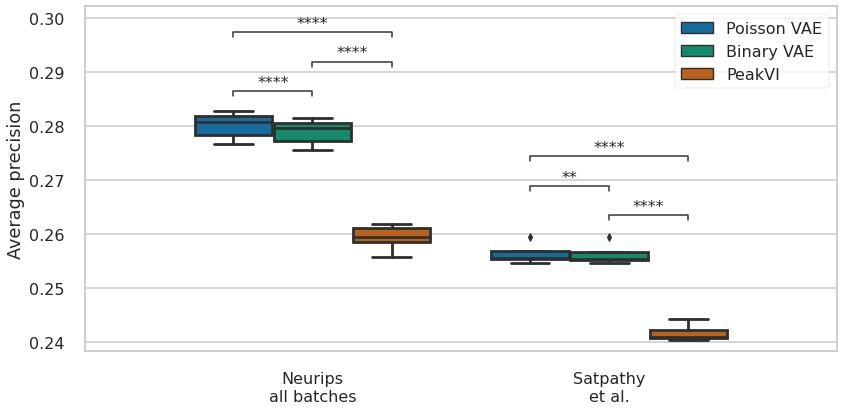

In [21]:
model_order = [model_type_map['poissonviTrue'], model_type_map['binaryviTrue'], model_type_map["peakvi"]]
plot_metrics_per_dataset(data=df, datasets=[dataset_map['neurips'],dataset_map['hematopoiesis']] , x='config.data.dataset', y='result.average_precision', hue='config.model.model_type', hue_order=model_order, y_label="Average precision", save_path=fig_path, figsize=(12,6))

# Plot embeddings

In [65]:
import scanpy as sc
sc.settings.figdir = fig_path

In [66]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=False,
                      color_map="YlGnBu_r",format='pdf', transparent=False, #YlGnBu_r
                    ipython_format='png2x', figsize=(8,8))

/home/icb/laura.martens/miniconda3/envs/poisson_atac_new/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [67]:
from poisson_atac.utils import load_experiment, compute_embedding

In [69]:
#import get_experiment function from seml run
from poisson_atac.experiments.atac_to_atac.experiment_runner import get_experiment

## Determine best embeddings based on average_precision

In [70]:
best = df.sort_values('result.average_precision', ascending=False).groupby(['config.data.dataset', 'config.model.model_type']).first()

In [71]:
best

_id  batch_id  \
config.data.dataset  config.model.model_type                                
Neurips\nall batches Binary VAE\n(observed seq. coverage)    67         3   
                     PeakVI\n(encoded seq. coverage)         62         3   
                     Poisson VAE\n(observed seq. coverage)   52         3   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)   151         7   
                     PeakVI\n(encoded seq. coverage)        146         7   
                     Poisson VAE\n(observed seq. coverage)   70         3   

                                                                                 config_hash  \
config.data.dataset  config.model.model_type                                                   
Neurips\nall batches Binary VAE\n(observed seq. coverage)   a5f0eb37a267cd1147021ae89f6de2fa   
                     PeakVI\n(encoded seq. coverage)        b3feda37c38d60b1e99b4c279240ba2e   
                     Poisson VAE\n(observed seq. coverage)  f956cc1e4780c256e437a37c8bc1935c   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)   1e7d434cfe8f33baf580c4b2a8e44660   
                     PeakVI\n(encoded seq. coverage)        094eab89c2905f303c3e0be006504ed1   
                     Poisson VAE\n(observed seq. coverage)  aa9577e0cd388aae56767ab1dda11dc6   

                                                            config.overwrite  \
config.data.dataset  config.model.model_type                                   
Neurips\nall batches Binary VAE\n(observed seq. coverage)                 67   
                     PeakVI\n(encoded seq. coverage)                      62   
                     Poisson VAE\n(observed seq. coverage)                52   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)                151   
                     PeakVI\n(encoded seq. coverage)                     146   
                     Poisson VAE\n(observed seq. coverage)                70   

                                                           config.db_collection  \
config.data.dataset  config.model.model_type                                      
Neurips\nall batches Binary VAE\n(observed seq. coverage)          atac_to_atac   
                     PeakVI\n(encoded seq. coverage)               atac_to_atac   
                     Poisson VAE\n(observed seq. coverage)         atac_to_atac   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)          atac_to_atac   
                     PeakVI\n(encoded seq. coverage)               atac_to_atac   
                     Poisson VAE\n(observed seq. coverage)         atac_to_atac   

                                                           config.data.batch  \
config.data.dataset  config.model.model_type                                   
Neurips\nall batches Binary VAE\n(observed seq. coverage)               None   
                     PeakVI\n(encoded seq. coverage)                    None   
                     Poisson VAE\n(observed seq. coverage)              None   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)               None   
                     PeakVI\n(encoded seq. coverage)                    None   
                     Poisson VAE\n(observed seq. coverage)              None   

                                                            config.optimization.regularization.learning_rate  \
config.data.dataset  config.model.model_type                                                                   
Neurips\nall batches Binary VAE\n(observed seq. coverage)                                             0.0001   
                     PeakVI\n(encoded seq. coverage)                                                  0.0001   
                     Poisson VAE\n(observed seq. coverage)                                            0.0001   
Satpathy\net al.     Binary VAE\n(observed seq. coverage)                                             0.0001   
                     PeakVI\n(encoded seq. coverage)   

## NeurIPS dataset

### PeakVI model

In [73]:
model_hash=best.loc[(dataset_map['neurips'], model_type_map["peakvi"]), "config_hash"]

In [74]:
model_hash

'b3feda37c38d60b1e99b4c279240ba2e'

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [ ]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

In [ ]:
sc.pl.umap(ex.adata, color="cell_type", save="peakvi.png")

In [ ]:
sc.pl.umap(ex.adata, color="batch", save="peakvi_batch.png")

### Poisson VAE model, observed seq. coverage

In [ ]:
model_hash=best.loc[(dataset_map['neurips'], model_type_map["poissonviTrue"]), "config_hash"]

In [ ]:
model_hash

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [193]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

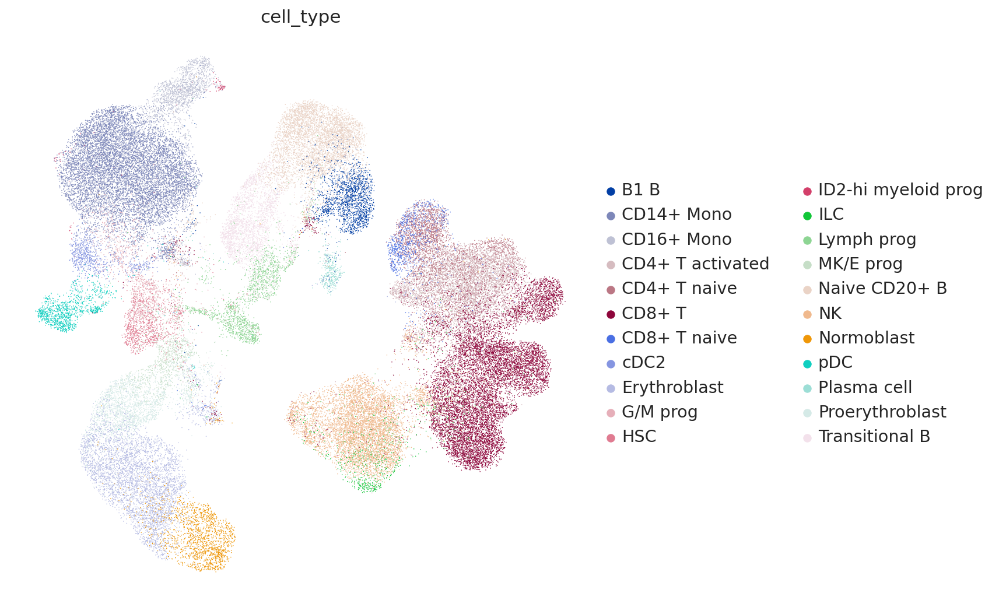

In [194]:
sc.pl.umap(ex.adata, color="cell_type", save='poissonviTrue.png')

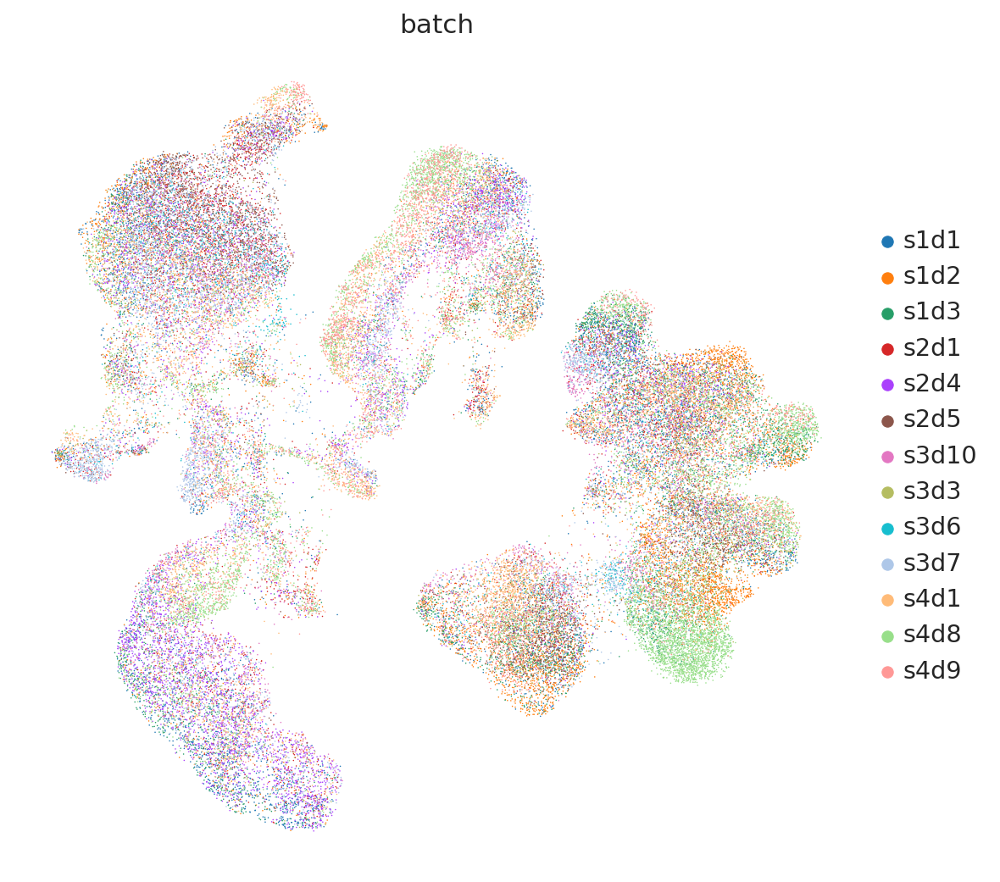

In [195]:
sc.pl.umap(ex.adata, color="batch", save='poissonviTrue_batch.png')

### Binary VAE model, observed seq. coverage

In [198]:
model_hash=best.loc[(dataset_map['neurips'], model_type_map["binaryviTrue"]), "config_hash"]

In [199]:
model_hash

'a5f0eb37a267cd1147021ae89f6de2fa'

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [201]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

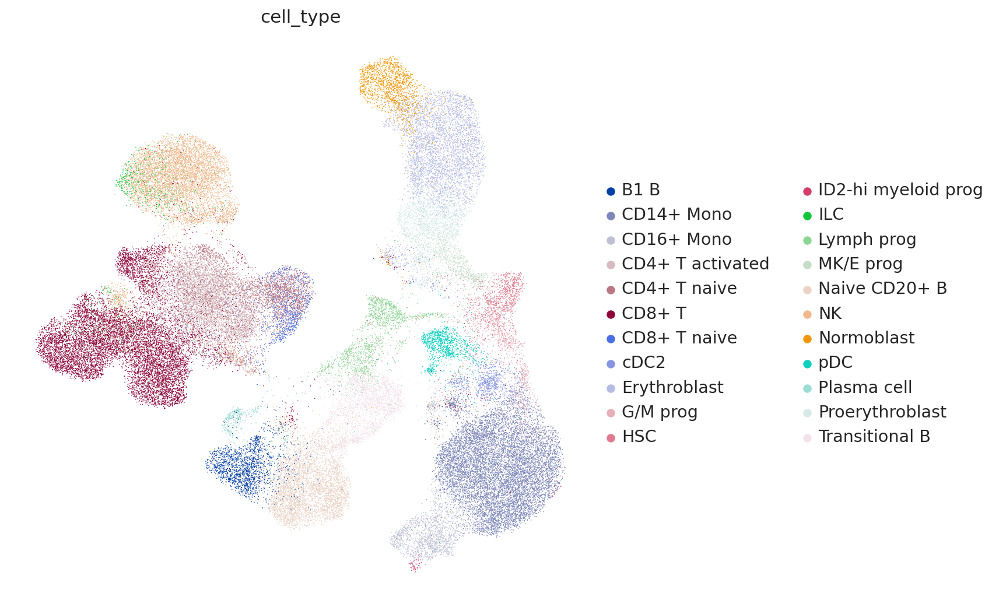

In [202]:
sc.pl.umap(ex.adata, color="cell_type", save='binaryviTrue.png')

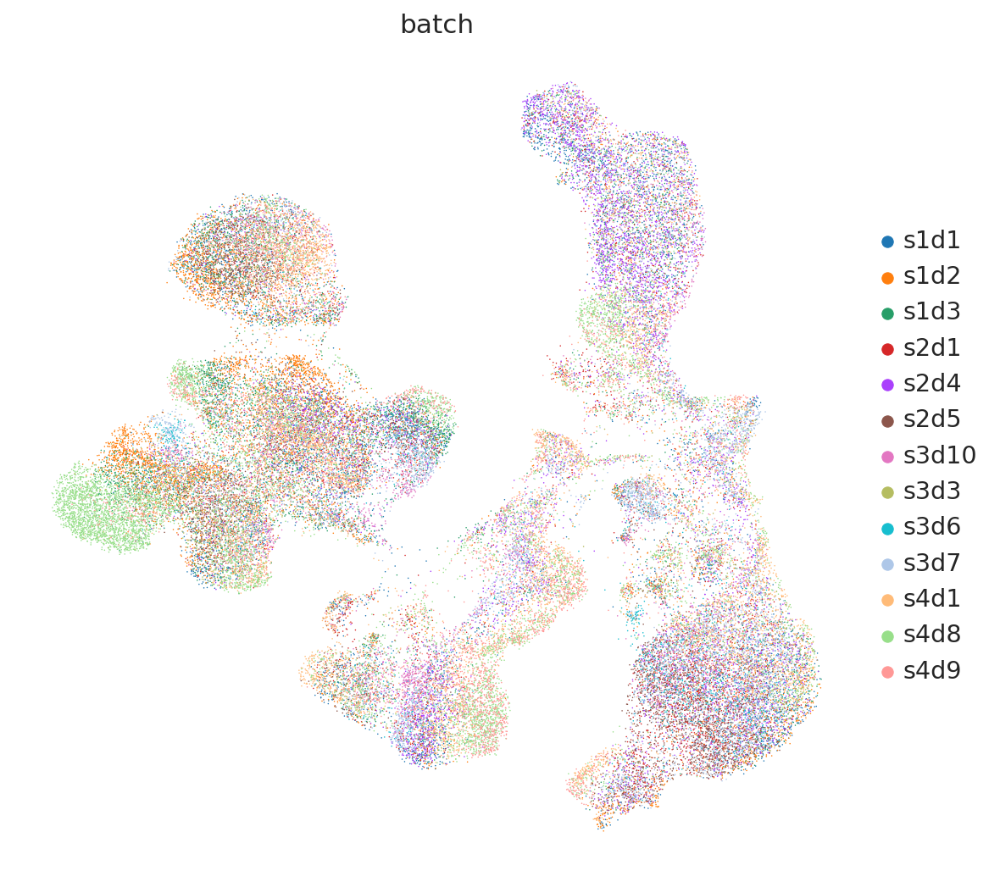

In [203]:
sc.pl.umap(ex.adata, color="batch", save='binaryviTrue_batch.png')

## Hematopoeisis dataset

### PeakVI model

In [206]:
model_hash=best.loc[(dataset_map['hematopoiesis'], model_type_map["peakvi"]), "config_hash"]

In [207]:
model_hash

'094eab89c2905f303c3e0be006504ed1'

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [209]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

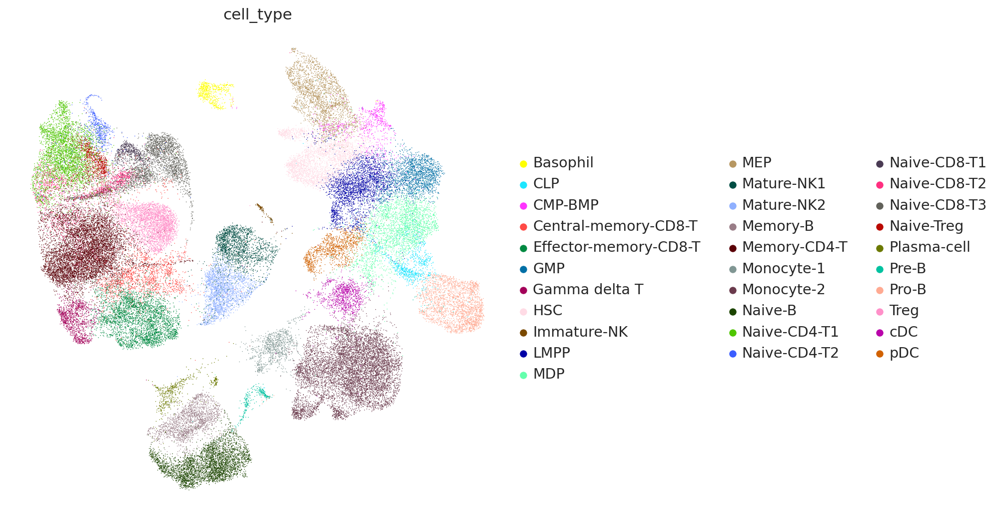

In [210]:
sc.pl.umap(ex.adata, color="cell_type", save="peakvi_hematopoiesis.png")

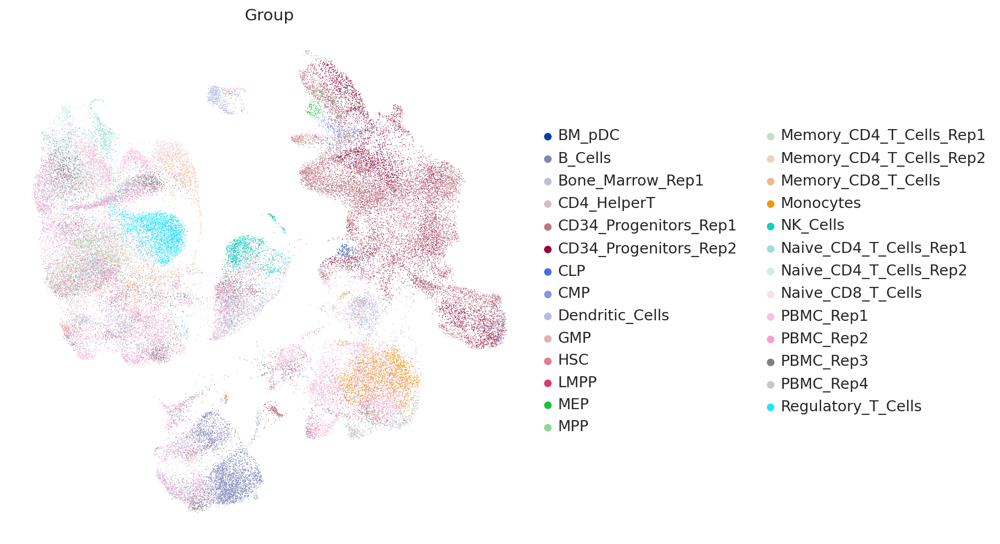

In [211]:
sc.pl.umap(ex.adata, color="Group", save="peakvi_hematopoiesis_group.png")

### Poisson VAE model, observed seq. coverage

In [214]:
model_hash=best.loc[(dataset_map['hematopoiesis'], model_type_map["poissonviTrue"]), "config_hash"]

In [215]:
model_hash

'aa9577e0cd388aae56767ab1dda11dc6'

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [217]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

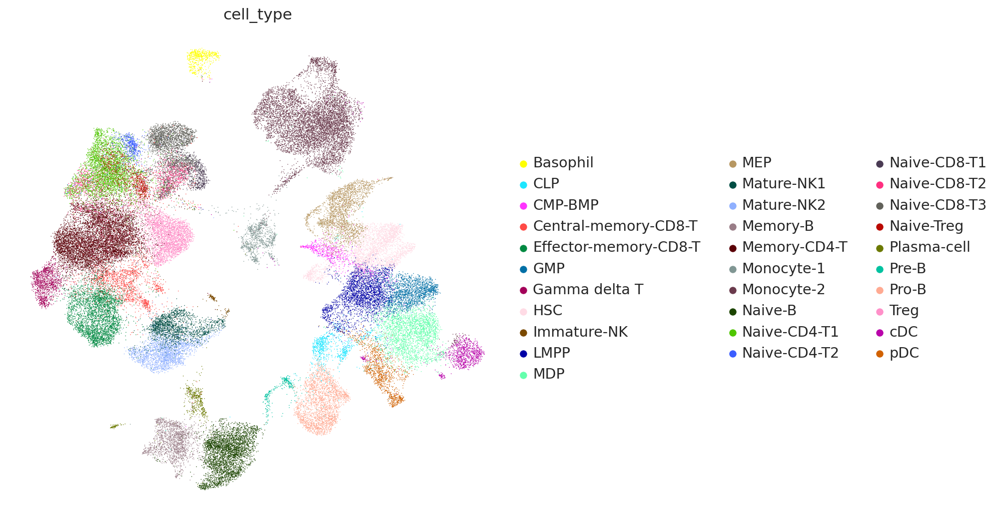

In [218]:
sc.pl.umap(ex.adata, color="cell_type", save='poissonviTrue_hematopoiesis.png')

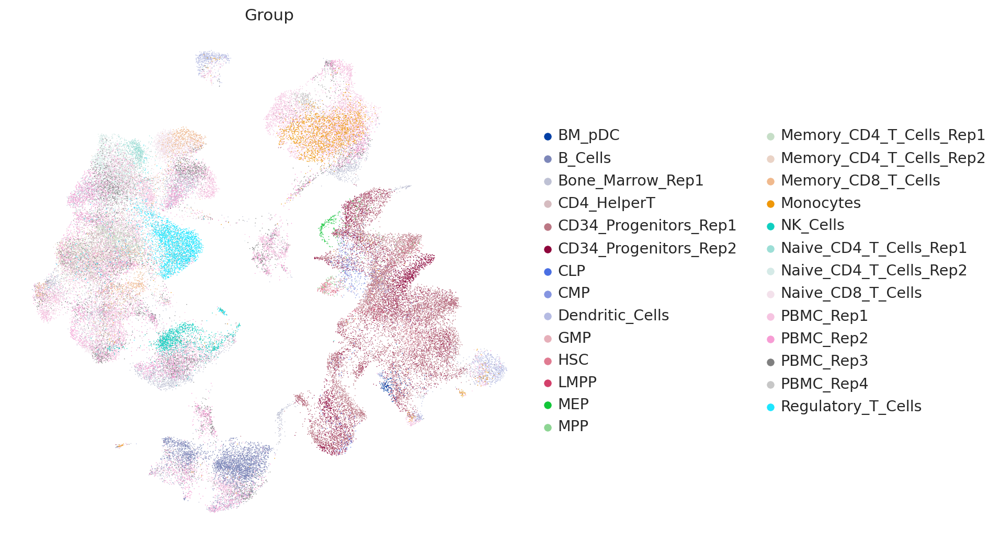

In [219]:
sc.pl.umap(ex.adata, color="Group", save='poissonviTrue_hematopoiesis_group.png')

### Binary VAE model, observed seq. coverage

In [222]:
model_hash=best.loc[(dataset_map['hematopoiesis'], model_type_map["binaryviTrue"]), "config_hash"]

In [223]:
model_hash

'1e7d434cfe8f33baf580c4b2a8e44660'

In [ ]:
ex, model, config = load_experiment(seml_database, model_hash, get_experiment)

In [225]:
X_emb = model.get_latent_representation(ex.adata)
compute_embedding(ex.adata, X_emb)

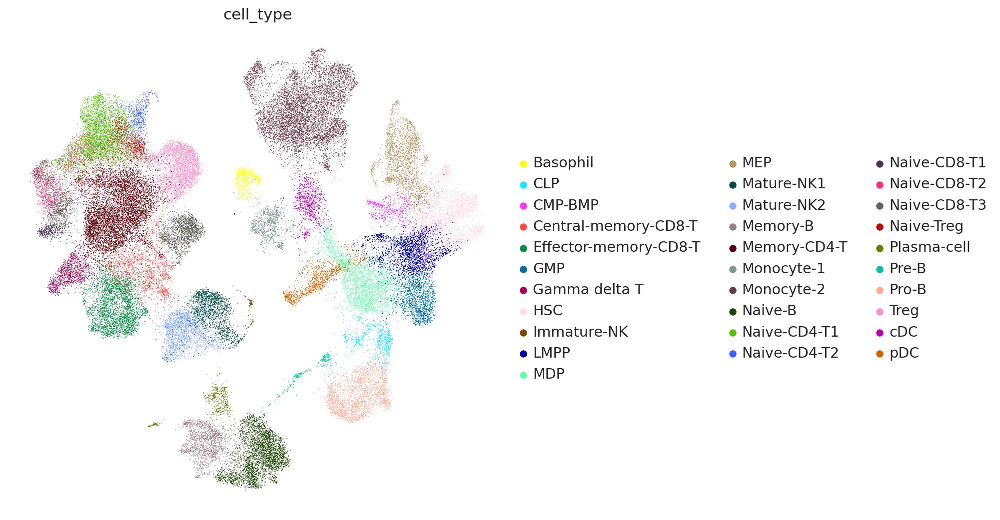

In [226]:
sc.pl.umap(ex.adata, color="cell_type", save='binaryviTrue_hematopoiesis.png')

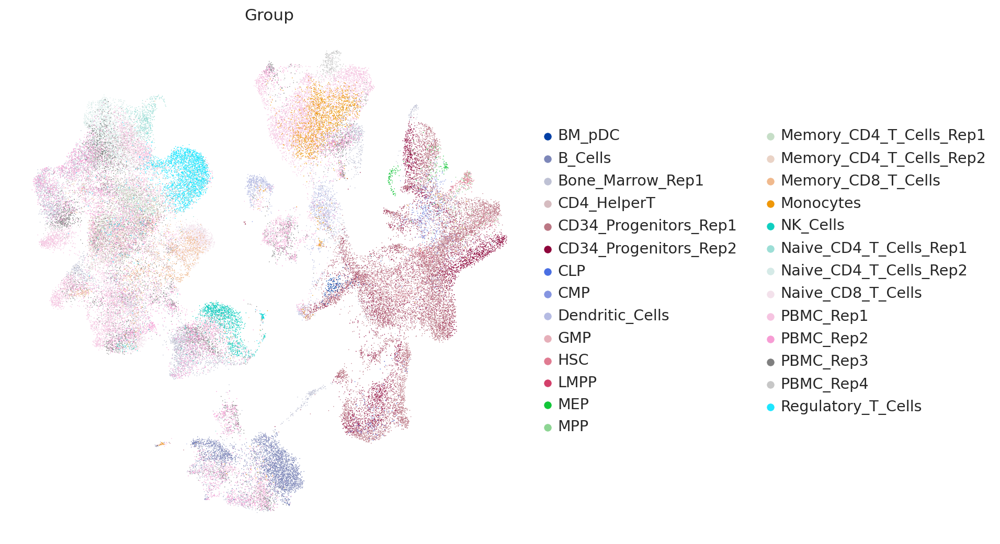

In [227]:
sc.pl.umap(ex.adata, color="Group", save='binaryviTrue_hematopoiesis_group.png')